# Introduction | Anime face dataset

The goal is to create a neural model (DCGAN) capable of generating new anime face images based on the Kaggle dataset. 

## Importing libraries, funcs & data


In [70]:
import os
import numpy as np
import warnings
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryFocalCrossentropy
from tensorflow.keras import Sequential
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")


## Importing dataset 

In [71]:
BASE_DIR = r'/kaggle/input/animefacedataset/images'

In [72]:
image_paths = []
for img in os.listdir(BASE_DIR):
  img_path = os.path.join(BASE_DIR, img)
  image_paths.append(img_path)

In [73]:
image_paths =image_paths[:int(len(image_paths)*0.5)]
len(image_paths)

31782

In [74]:
image_paths[0]

'/kaggle/input/animefacedataset/images/35715_2011.jpg'

# Preprocessing  data

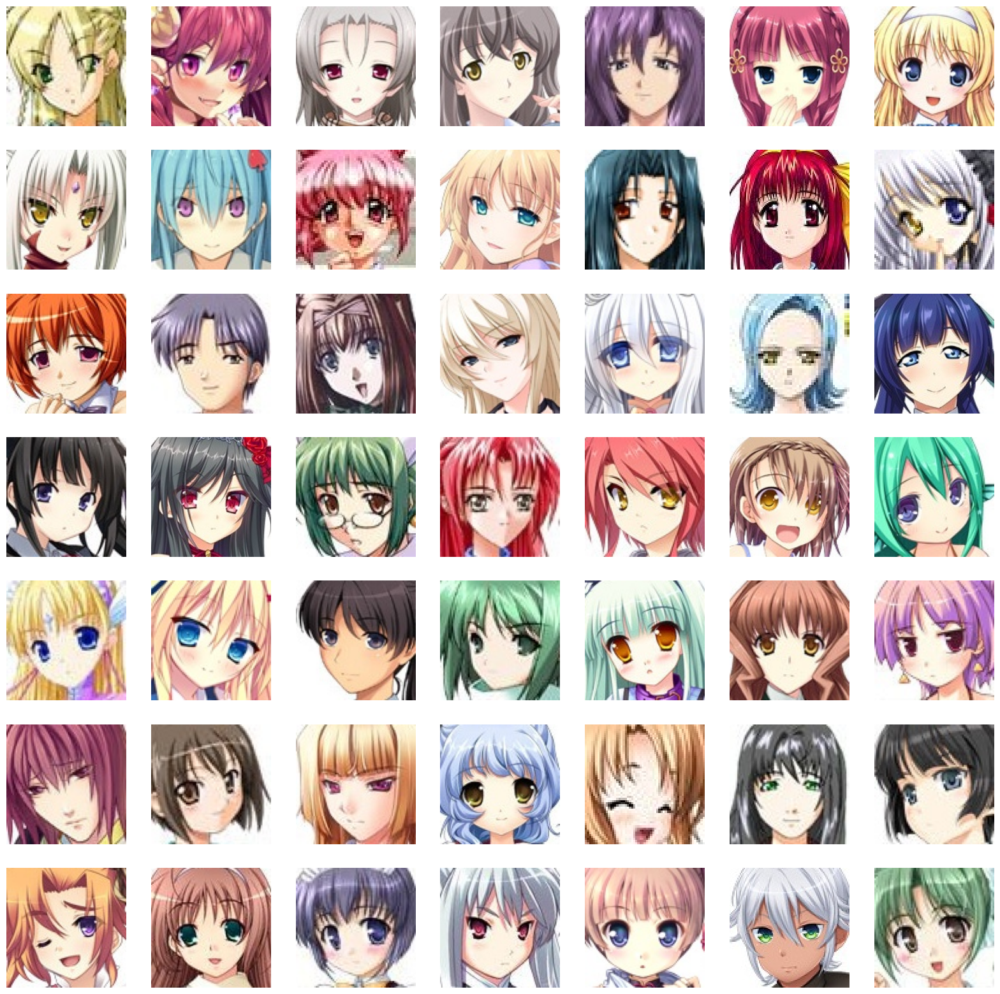

In [75]:
plt.figure(figsize =(20,20))
temp_images = image_paths[:49]
index  = 1
for image_path in temp_images:
  plt.subplot(7,7,index)
  index += 1
  img = load_img(image_path)
  img = array_to_img(img)
  plt.imshow(img)
  plt.axis('off')

In [76]:

height = width =  64
target_size = (height, width)

train_images = [img_to_array(load_img(path, target_size=target_size)) for path in tqdm(image_paths)]
train_images = np.array(train_images)


  0%|          | 0/31782 [00:00<?, ?it/s]

In [77]:
train_images[0].shape

(64, 64, 3)

In [78]:
train_images = train_images.reshape(train_images.shape[0],height,width,3).astype('float32')

In [79]:
train_images = (train_images-127.5)/127.5

In [80]:
train_images[0]

array([[[ 0.28627452,  0.24705882,  0.07450981],
        [ 0.8509804 ,  0.81960785,  0.62352943],
        [ 0.1764706 ,  0.16862746, -0.06666667],
        ...,
        [ 0.25490198,  0.23137255, -0.09019608],
        [ 0.34901962,  0.31764707,  0.04313726],
        [ 0.827451  ,  0.77254903,  0.5529412 ]],

       [[ 1.        ,  1.        ,  0.8039216 ],
        [ 0.30980393,  0.2784314 ,  0.06666667],
        [-0.05882353, -0.06666667, -0.30980393],
        ...,
        [ 0.5137255 ,  0.49803922,  0.12156863],
        [-0.07450981, -0.10588235, -0.40392157],
        [ 0.49803922,  0.4509804 ,  0.2       ]],

       [[ 0.09019608,  0.05882353, -0.16862746],
        [-0.5372549 , -0.56078434, -0.8039216 ],
        [ 0.90588236,  0.8901961 ,  0.5921569 ],
        ...,
        [ 0.5294118 ,  0.5137255 ,  0.06666667],
        [ 0.03529412,  0.00392157, -0.37254903],
        [ 0.06666667,  0.02745098, -0.27058825]],

       ...,

       [[ 0.9764706 ,  1.        ,  0.9843137 ],
        [ 0

## Deep Convolutional Generative Adversarial Network 


### Creating the Generator

In [81]:
LATENT_DIM = 100
WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
CHANNELS =3

In [82]:
def Generator_Model():
    gen = Sequential(name='generator')
    gen.add(layers.Dense(8*8*512,input_dim=LATENT_DIM))
    gen.add(layers.BatchNormalization())
    gen.add(layers.ReLU())

    gen.add(layers.Reshape((8,8,512)))
    gen.add(layers.Conv2DTranspose(256,(4,4), strides=(2,2),padding='same', kernel_initializer=WEIGHT_INIT))
    gen.add(layers.BatchNormalization())
    gen.add(layers.ReLU())

    gen.add(layers.Conv2DTranspose(128,(4,4), strides=(2,2),padding='same', kernel_initializer=WEIGHT_INIT))
    gen.add(layers.BatchNormalization())
    gen.add(layers.ReLU())

    gen.add(layers.Conv2DTranspose(64,(4,4), strides=(2,2),padding='same', kernel_initializer=WEIGHT_INIT))
    gen.add(layers.BatchNormalization())
    gen.add(layers.ReLU())

    gen.add(layers.Conv2D(CHANNELS, (4,4), padding='same', activation='tanh'))
    return gen 
generator = Generator_Model() 
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 32768)          │     3,309,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_8 (ReLU)                  │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_2 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 16, 16, 256)    │     2,097,408 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_9 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 32, 32, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_10 (ReLU)                 │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_8              │ (None, 64, 64, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_11 (ReLU)                 │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 3)      │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,198,467 (23.65 MB)

 Trainable params: 6,132,035 (23.39 MB)

 Non-trainable params: 66,432 (259.50 KB)

### Creating the Discriminator

In [83]:
def Discriminator_Model():
    disc = Sequential(name='discriminator')
    input_shape = (64,64,3)
    alpha = 0.2
    disc.add(layers.Conv2D(64,(4,4), strides=(2,2), padding='same', input_shape=input_shape))
    disc.add(layers.BatchNormalization())
    disc.add(layers.LeakyReLU(alpha=alpha))

    disc.add(layers.Conv2D(128,(4,4), strides=(2,2), padding='same', input_shape=input_shape))
    disc.add(layers.BatchNormalization())
    disc.add(layers.LeakyReLU(alpha=alpha))

    disc.add(layers.Conv2D(128,(4,4), strides=(2,2), padding='same', input_shape=input_shape))
    disc.add(layers.BatchNormalization())
    disc.add(layers.LeakyReLU(alpha=alpha))


    disc.add(layers.Flatten())
    disc.add(layers.Dropout(0.3))

    disc.add(layers.Dense(1, activation='sigmoid'))
    return disc 
discriminator = Discriminator_Model()
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 8, 8, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

### Creating DCGAN

In [84]:
class DCGAN(keras.Model):
  def __init__(self, discriminator, generator, latent_dim):
    super(DCGAN, self).__init__()
    self.discriminator = discriminator
    self.generator = generator
    self.latent_dim = latent_dim
    self.g_loss_metric = keras.metrics.Mean(name='g_loss')
    self.d_loss_metric = keras.metrics.Mean(name='d_loss')

  @property
  def metrics(self):
    return [self.g_loss_metric, self.d_loss_metric]

  def compile(self, g_optimizer, d_optimizer, loss_fn):
    super(DCGAN, self).compile()
    self.g_optimizer = g_optimizer
    self.d_optimizer = d_optimizer
    self.loss_fn = loss_fn
    
  def train_step(self, real_images):
    batch_size = tf.shape(real_images)[0]
    random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))
    with tf.GradientTape() as tape:
      pred_real = self.discriminator(real_images, training=True)
      real_labels = tf.ones((batch_size,1))
      d_loss_real = self.loss_fn(real_labels, pred_real)

      fake_images = self.generator(random_noise)
      pred_fake = self.discriminator(fake_images, training=True)
      fake_labels = tf.zeros((batch_size,1))
      d_loss_fake = self.loss_fn(fake_labels, pred_fake)

      d_loss = (d_loss_real+d_loss_fake)/2
    gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)

    self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

    labels = tf.ones((batch_size, 1))
    with tf.GradientTape() as tape:
      fake_images = self.generator(random_noise)
      pred_fake = self.discriminator(fake_images, training=True)
      g_loss = self.loss_fn(labels, pred_fake)

    gradients = tape.gradient(g_loss, self.generator.trainable_variables)
    self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

    self.d_loss_metric.update_state(d_loss)
    self.g_loss_metric.update_state(g_loss)
    return {
        "g_loss": self.g_loss_metric.result(),
        "d_loss": self.d_loss_metric.result(),
    }

### The monitoring process

In [85]:
class DCGANMonitor(keras.callbacks.Callback):
  def __init__(self, num_img=6, latent_dim=100):
    self.num_img = num_img
    self.latent_dim = latent_dim
    self.noise = tf.random.normal([25, self.latent_dim])

  def on_epoch_end(self, epoch, logs=None):
    g_img = self.model.generator(self.noise)
    g_img = (g_img*127.5)+127.5
    g_img.numpy()
    fig = plt.figure(figsize=(10,10))
    for i in range(self.num_img):
      plt.subplot(5,5,i+1)
      img = array_to_img(g_img[i])
      plt.imshow(img)
      plt.axis('off')
    plt.show()
  def on_train_end(self, logs=None):
    self.model.generator.save('generator.h5')



## Model training

In [86]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

In [87]:
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(
    d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5),
    g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5),
    loss_fn=BinaryFocalCrossentropy()
)

Epoch 1/30
  5/994 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - d_loss: 0.9961 - g_loss: 0.3046 

I0000 00:00:1729023218.556137     355 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_concatenate_fusion_4', 4 bytes spill stores, 4 bytes spill loads



994/994 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - d_loss: 0.9501 - g_loss: 0.9683

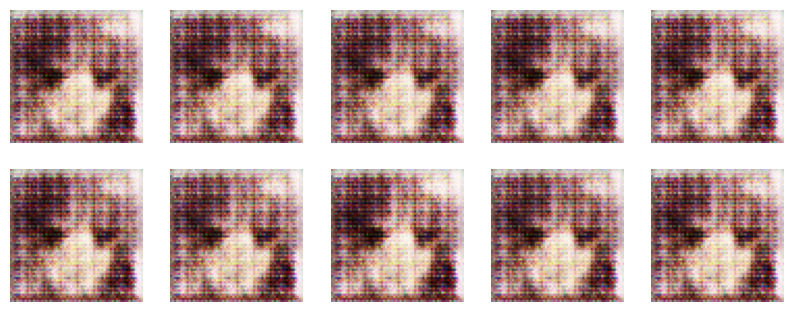

994/994 ━━━━━━━━━━━━━━━━━━━━ 57s 41ms/step - d_loss: 0.9497 - g_loss: 0.9685
Epoch 2/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.2396 - g_loss: 0.7059

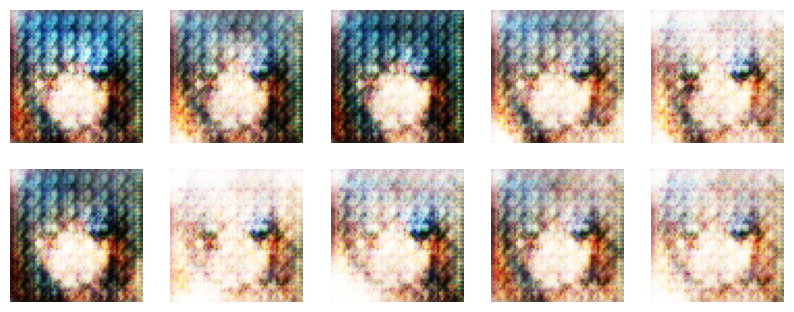

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.2396 - g_loss: 0.7057
Epoch 3/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1969 - g_loss: 0.4056

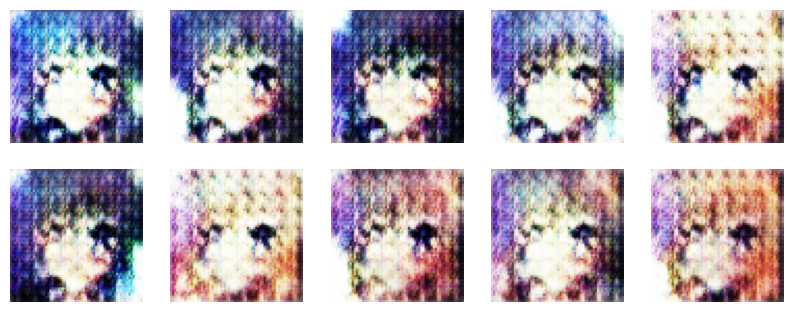

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1969 - g_loss: 0.4056
Epoch 4/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1898 - g_loss: 0.3675

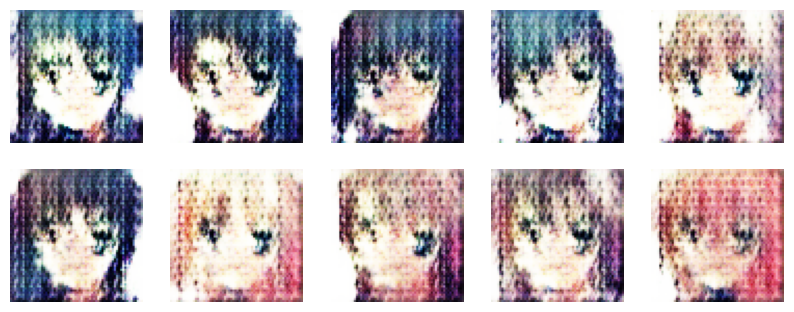

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1898 - g_loss: 0.3675
Epoch 5/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1816 - g_loss: 0.3675

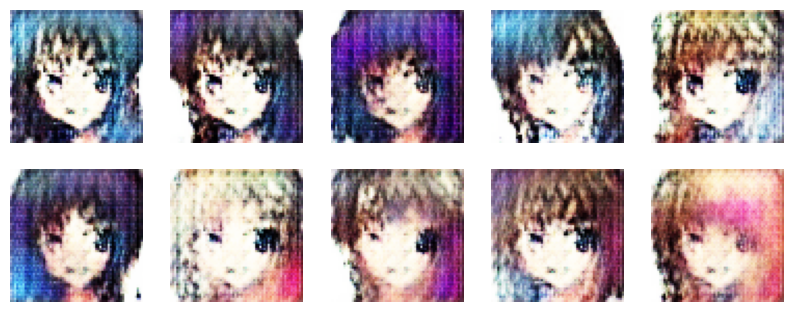

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - d_loss: 0.1816 - g_loss: 0.3675
Epoch 6/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1826 - g_loss: 0.3258

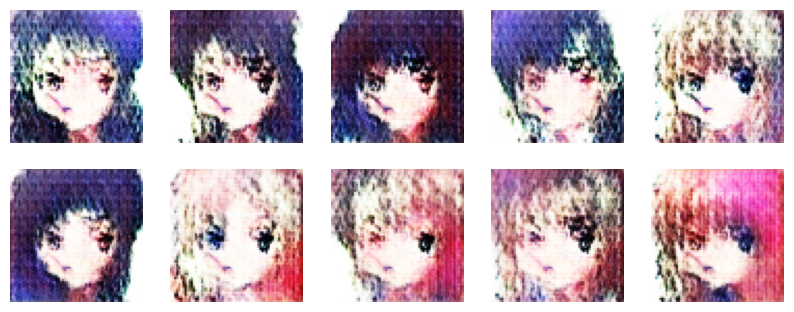

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1826 - g_loss: 0.3258
Epoch 7/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1737 - g_loss: 0.3217

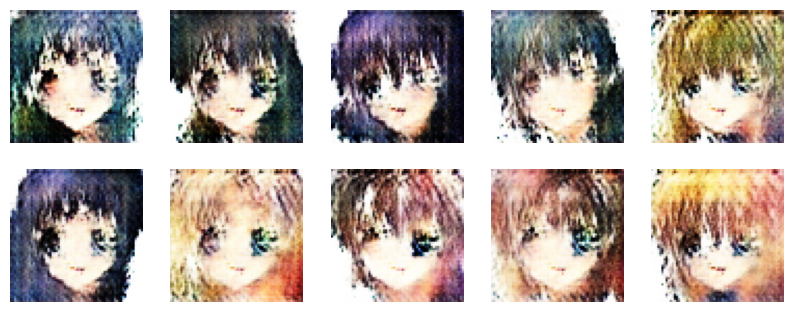

994/994 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - d_loss: 0.1737 - g_loss: 0.3217
Epoch 8/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1766 - g_loss: 0.3079

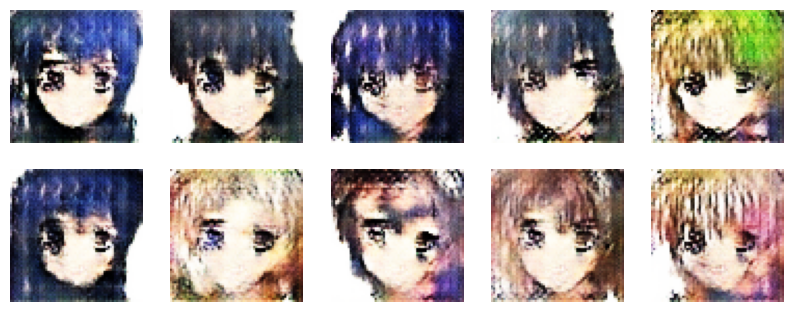

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1766 - g_loss: 0.3079
Epoch 9/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1787 - g_loss: 0.2773

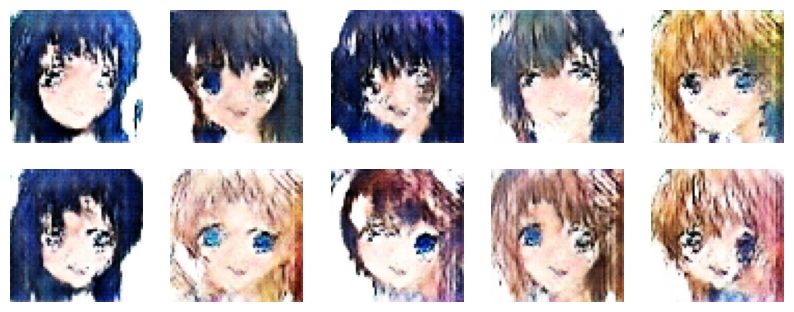

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1787 - g_loss: 0.2773
Epoch 10/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1772 - g_loss: 0.2625

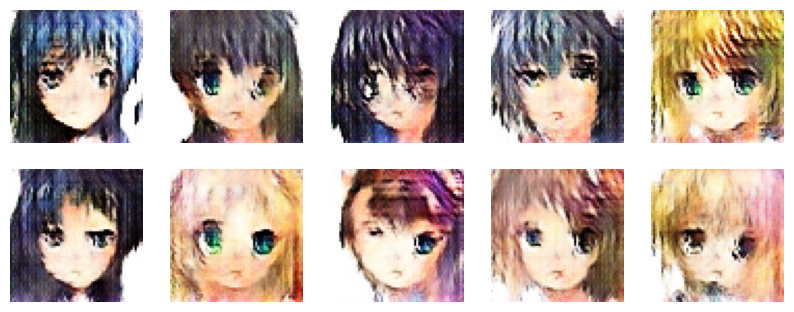

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1772 - g_loss: 0.2625
Epoch 11/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - d_loss: 0.1788 - g_loss: 0.2367

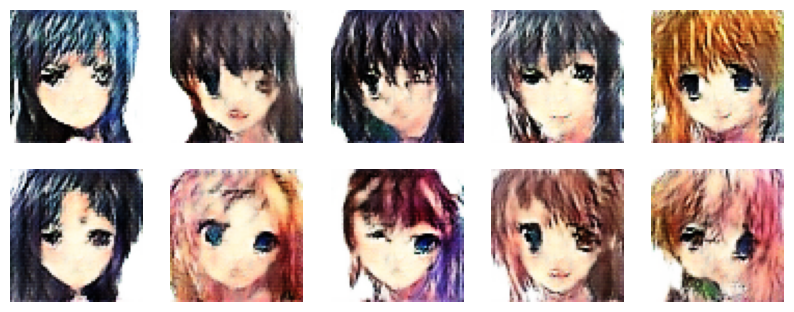

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1788 - g_loss: 0.2367
Epoch 12/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1783 - g_loss: 0.2295

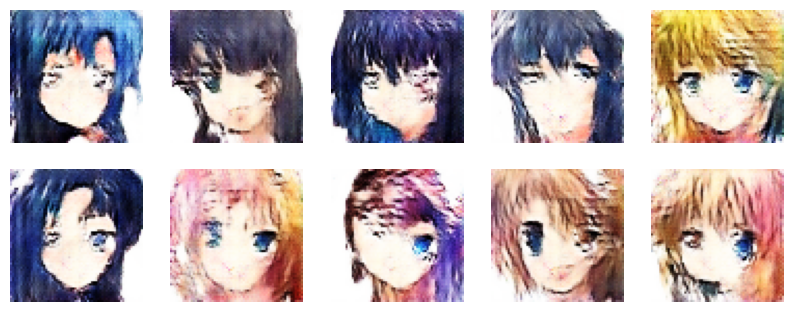

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1783 - g_loss: 0.2295
Epoch 13/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1785 - g_loss: 0.2256

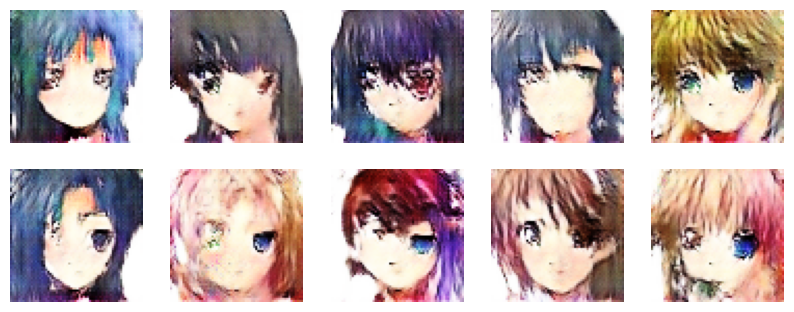

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - d_loss: 0.1785 - g_loss: 0.2256
Epoch 14/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1759 - g_loss: 0.2238

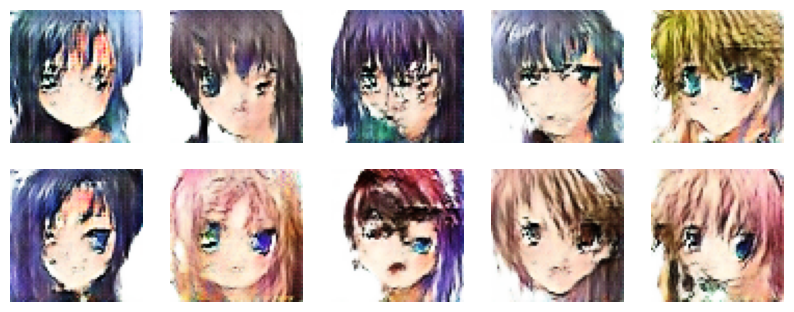

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - d_loss: 0.1759 - g_loss: 0.2238
Epoch 15/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1755 - g_loss: 0.2235

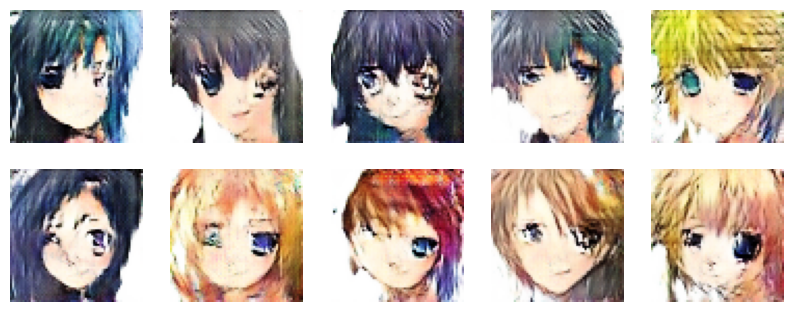

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - d_loss: 0.1755 - g_loss: 0.2235
Epoch 16/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1751 - g_loss: 0.2197

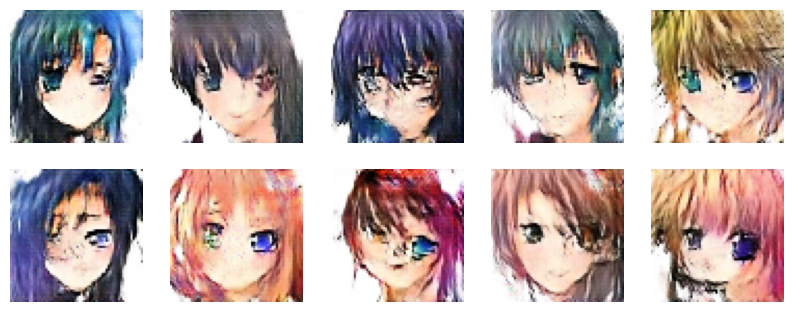

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1751 - g_loss: 0.2197
Epoch 17/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1750 - g_loss: 0.2198

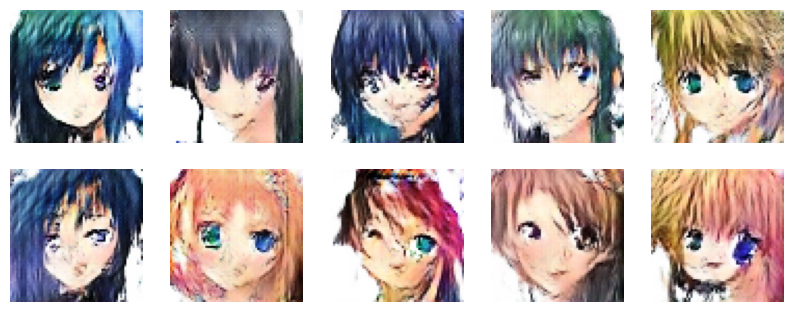

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - d_loss: 0.1750 - g_loss: 0.2198
Epoch 18/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1748 - g_loss: 0.2186

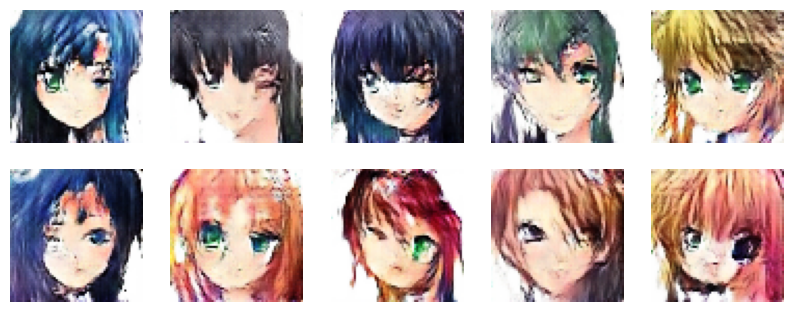

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - d_loss: 0.1748 - g_loss: 0.2186
Epoch 19/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1742 - g_loss: 0.2159

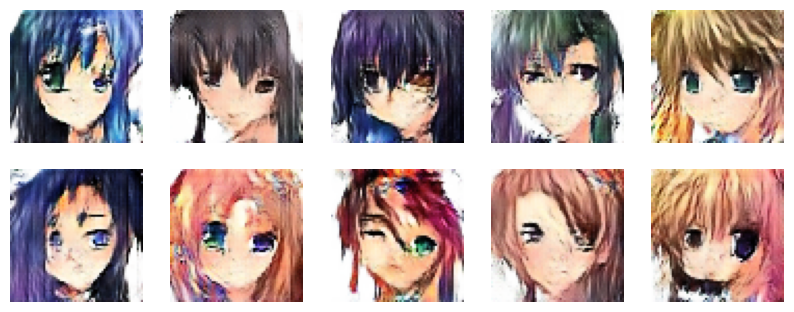

994/994 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - d_loss: 0.1742 - g_loss: 0.2159
Epoch 20/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1742 - g_loss: 0.2147

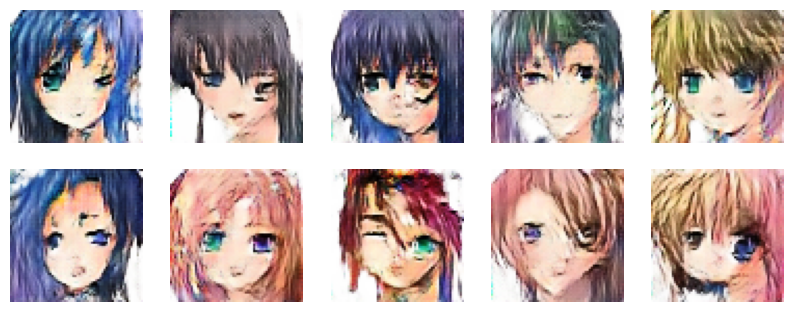

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - d_loss: 0.1742 - g_loss: 0.2147
Epoch 21/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1743 - g_loss: 0.2140

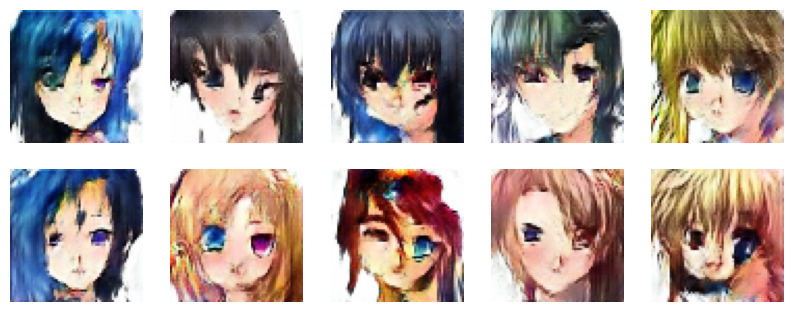

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - d_loss: 0.1743 - g_loss: 0.2140
Epoch 22/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1745 - g_loss: 0.2129

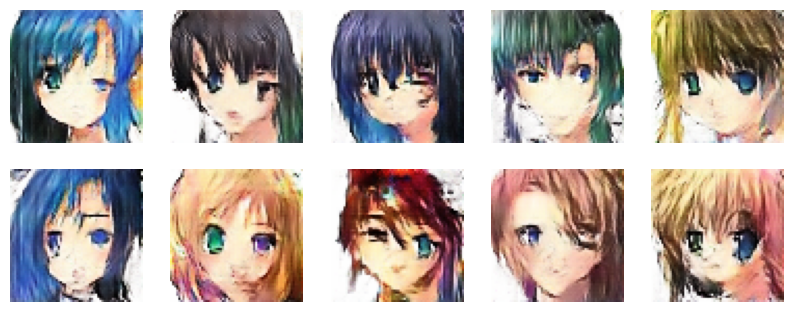

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1745 - g_loss: 0.2129
Epoch 23/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1732 - g_loss: 0.2137

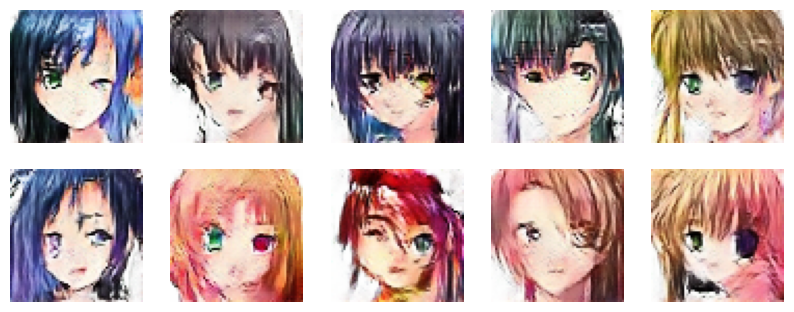

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1732 - g_loss: 0.2137
Epoch 24/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1737 - g_loss: 0.2137

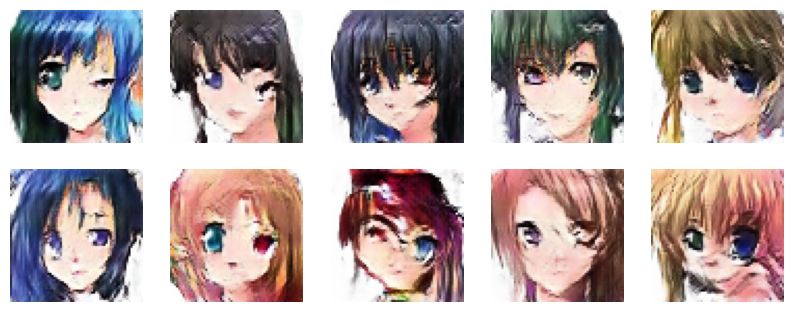

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1737 - g_loss: 0.2137
Epoch 25/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1735 - g_loss: 0.2130

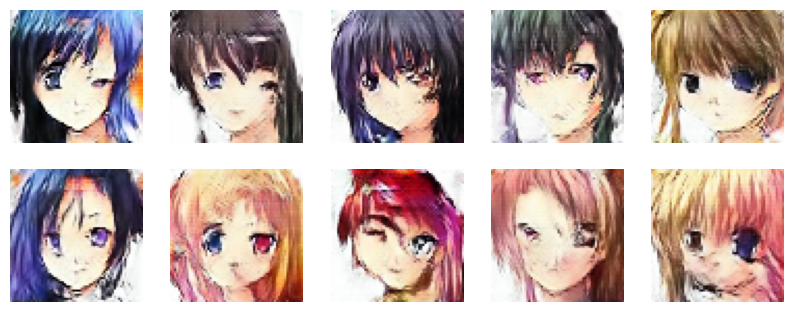

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1735 - g_loss: 0.2130
Epoch 26/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1725 - g_loss: 0.2139

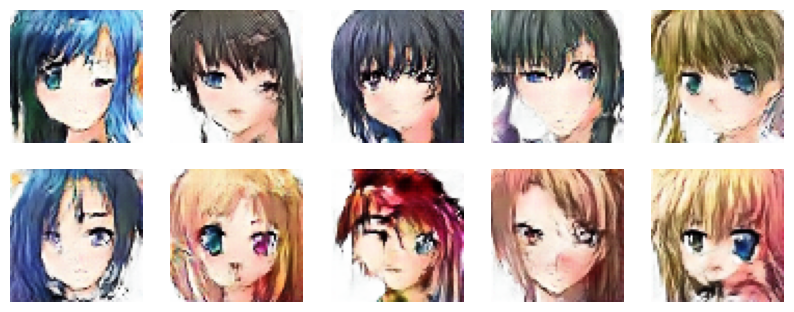

994/994 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - d_loss: 0.1725 - g_loss: 0.2139
Epoch 27/30
992/994 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - d_loss: 0.1727 - g_loss: 0.2132

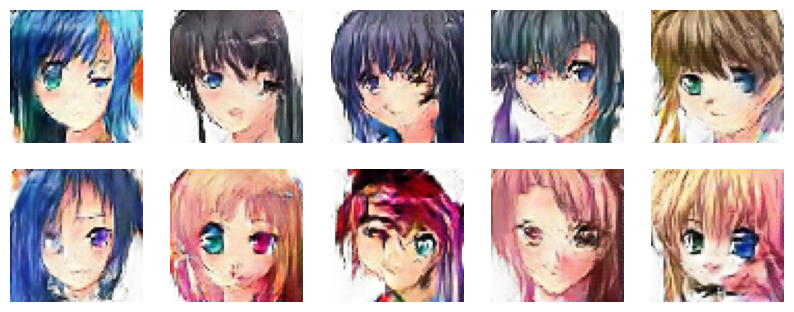

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1727 - g_loss: 0.2132
Epoch 28/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1719 - g_loss: 0.2140

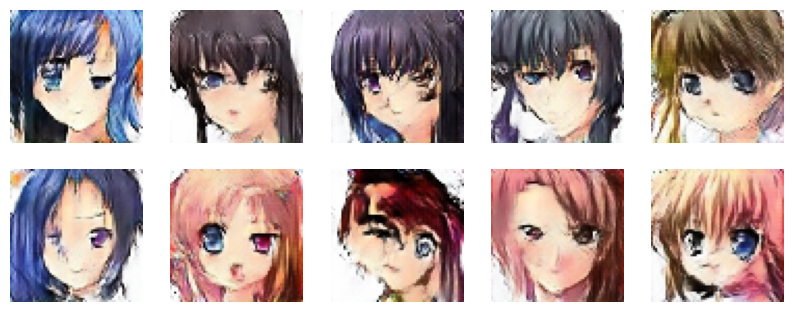

994/994 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - d_loss: 0.1719 - g_loss: 0.2140
Epoch 29/30
992/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1716 - g_loss: 0.2151

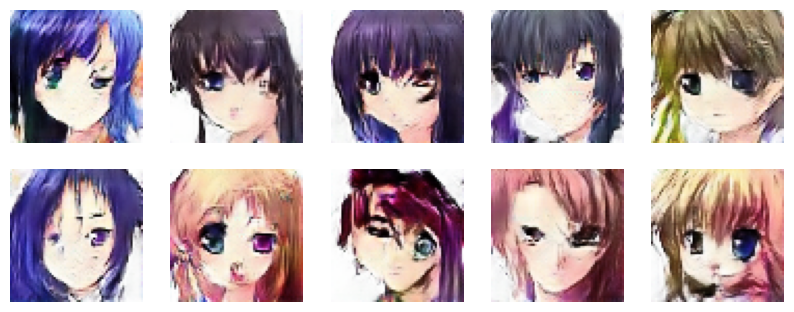

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1716 - g_loss: 0.2151
Epoch 30/30
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - d_loss: 0.1715 - g_loss: 0.2152

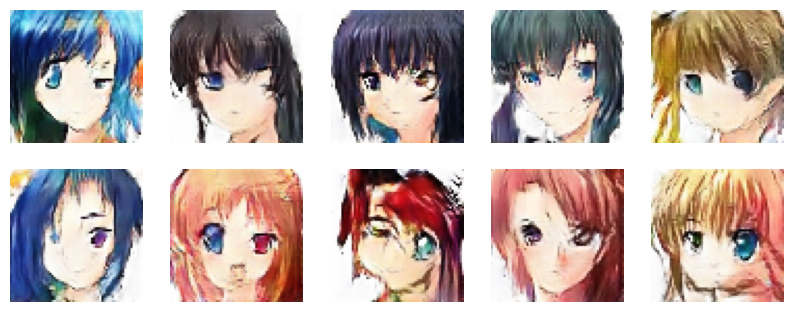

994/994 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - d_loss: 0.1715 - g_loss: 0.2152


In [88]:
N_EPOCHS = 30
history = dcgan.fit(
    train_images,
    epochs=N_EPOCHS,
    callbacks=[DCGANMonitor(num_img=10, latent_dim=LATENT_DIM)]
)

## Model evaluation 

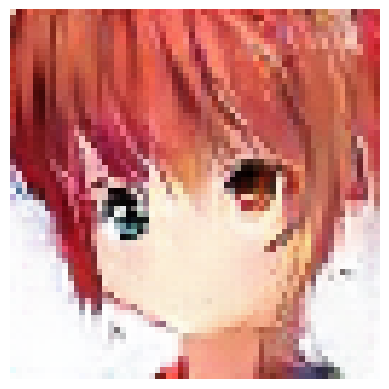

In [46]:
noise = tf.random.normal([1,100])
g_img = dcgan.generator(noise)
g_img = (g_img*127.5)*127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
plt.show()


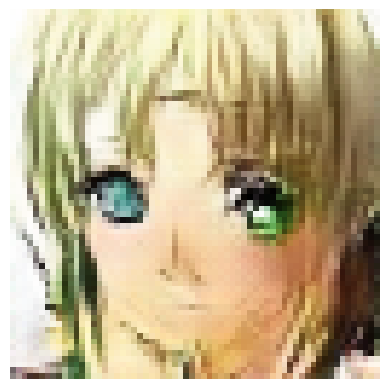

In [103]:
noise = tf.random.normal([1,100])
g_img = dcgan.generator(noise)
g_img = (g_img*127.5)*127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
plt.show()


In [98]:
def create_loss_fig(d_loss, g_loss):
    plt.figure(figsize=(10,6))
    plt.plot(d_loss, label='discriminator loss')
    plt.plot(g_loss, label='generator loss')
    plt.title('gen and disc losses')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.grid(True)
    plt.show()

In [92]:
d_loss_values = history.history['d_loss']
g_loss_values = history.history['g_loss']

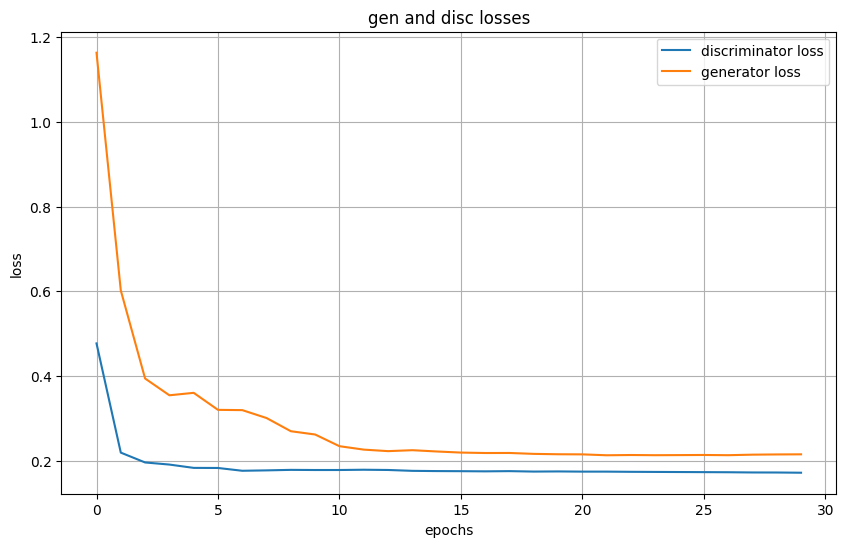

In [93]:
create_loss_fig(d_loss_values,g_loss_values)